In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
from sklearn.naive_bayes import GaussianNB 
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegression


from sklearn.metrics import confusion_matrix,auc,roc_auc_score
from sklearn.metrics import recall_score, precision_score, accuracy_score, f1_score

%matplotlib notebook

from pandasql import sqldf
pysqldf = lambda q:sqldf(q,globals())

In [29]:
custd = pd.read_excel('CUSTOMER_DETAILS.xlsx',index_col='User_ID')
locd = pd.read_excel('LOCATIONS_DETAILS.xlsx')
prod = pd.read_csv('PRODUCT_DETAILS.csv')

custd.shape



prod.shape

df1 = custd.index.map(locd['User_ID'])

df2 =  locd.index.map(prod['User_ID'])

df1

In [2]:
bf = pd.read_csv('BlackFriday.csv')
bf.shape

(537577, 12)

In [3]:
bf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 537577 entries, 0 to 537576
Data columns (total 12 columns):
User_ID                       537577 non-null int64
Product_ID                    537577 non-null object
Gender                        537577 non-null object
Age                           537577 non-null object
Occupation                    537577 non-null int64
City_Category                 537577 non-null object
Stay_In_Current_City_Years    537577 non-null object
Marital_Status                537577 non-null int64
Product_Category_1            537577 non-null int64
Product_Category_2            370591 non-null float64
Product_Category_3            164278 non-null float64
Purchase                      537577 non-null int64
dtypes: float64(2), int64(5), object(5)
memory usage: 49.2+ MB


In [4]:
bf.describe()

,User_ID,Occupation,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
count,5.375770e+05,537577.00000,537577.000000,537577.000000,370591.000000,164278.000000,537577.000000
mean,1.002992e+06,8.08271,0.408797,5.295546,9.842144,12.669840,9333.859853
std,1.714393e+03,6.52412,0.491612,3.750701,5.087259,4.124341,4981.022133
min,1.000001e+06,0.00000,0.000000,1.000000,2.000000,3.000000,185.000000
25%,1.001495e+06,2.00000,0.000000,1.000000,5.000000,9.000000,5866.000000
50%,1.003031e+06,7.00000,0.000000,5.000000,9.000000,14.000000,8062.000000
75%,1.004417e+06,14.00000,1.000000,8.000000,15.000000,16.000000,12073.000000
max,1.006040e+06,20.00000,1.000000,18.000000,18.000000,18.000000,23961.000000


In [5]:
bf.nunique()

User_ID                        5891
Product_ID                     3623
Gender                            2
Age                               7
Occupation                       21
City_Category                     3
Stay_In_Current_City_Years        5
Marital_Status                    2
Product_Category_1               18
Product_Category_2               17
Product_Category_3               15
Purchase                      17959
dtype: int64

In [20]:
bf[bf['Product_Category_1']==1]

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
1,1000001,P00248942,F,0-17,10,A,2,0,1,6.0,14.0,15200
5,1000003,P00193542,M,26-35,15,A,3,0,1,2.0,NaN,15227
6,1000004,P00184942,M,46-50,7,B,2,1,1,8.0,17.0,19215
7,1000004,P00346142,M,46-50,7,B,2,1,1,15.0,NaN,15854
8,1000004,P0097242,M,46-50,7,B,2,1,1,16.0,NaN,15686
13,1000005,P00145042,M,26-35,20,A,1,1,1,2.0,5.0,15665
18,1000007,P00036842,M,36-45,1,B,1,1,1,14.0,16.0,11788
19,1000008,P00249542,M,26-35,12,C,4+,1,1,5.0,15.0,19614
24,1000008,P00303442,M,26-35,12,C,4+,1,1,8.0,14.0,11927
38,1000010,P00155442,F,36-45,1,B,4+,1,1,11.0,15.0,15212


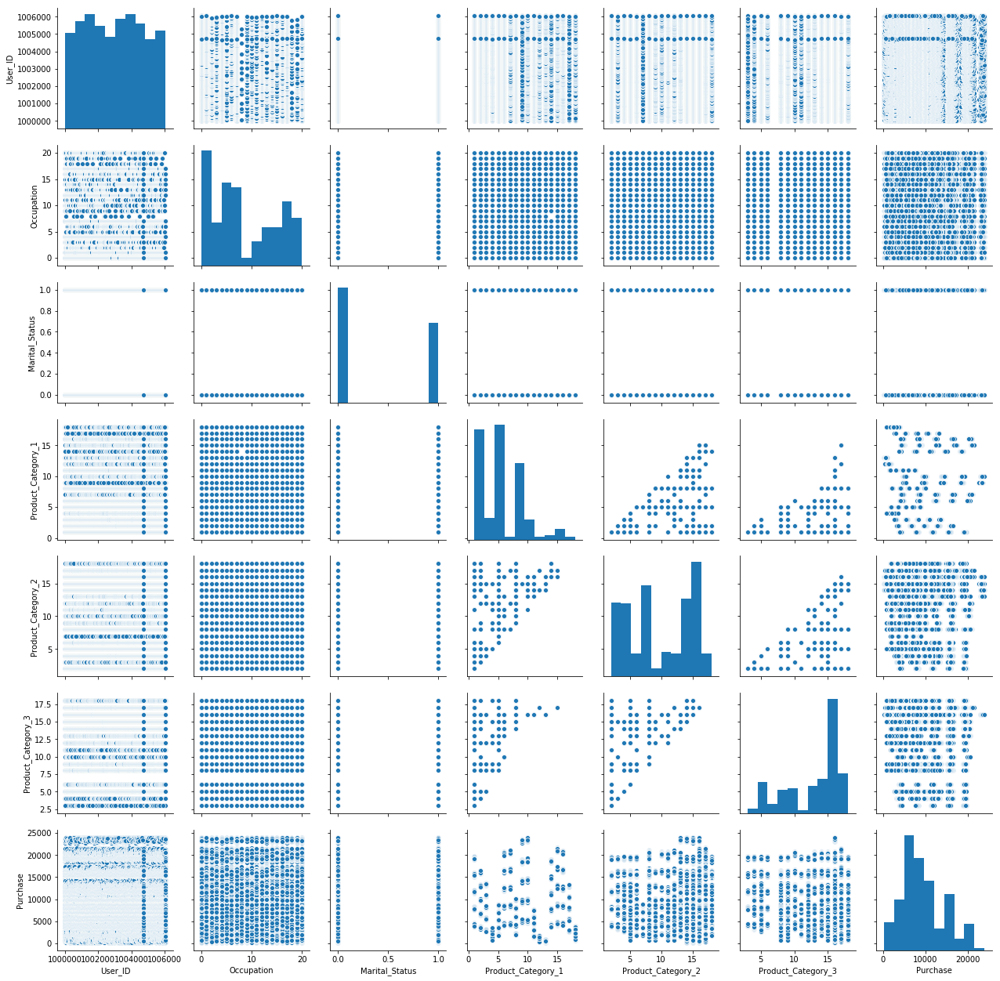

In [35]:
sns.pairplot(bf);

In [25]:
age_product_gb = bf[['Age', 'Product_ID', 'Purchase']].groupby(['Age', 'Product_ID']).agg('count').rename(columns={'Purchase': 'count'})
age_product_gb.sort_values('count', inplace=True, ascending=False)
ages = sorted(bf.Age.unique())
result = pd.DataFrame({ x: list(age_product_gb.loc[x].index)[:10] for x in ages}, index=['#{}'.format(x) for x in range(1,11)])
display(result)

,0-17,18-25,26-35,36-45,46-50,51-55,55+
#1,P00255842,P00265242,P00265242,P00025442,P00265242,P00265242,P00265242
#2,P00145042,P00112142,P00110742,P00110742,P00046742,P00025442,P00080342
#3,P00112142,P00110742,P00112142,P00265242,P00025442,P00110742,P00051442
#4,P00242742,P00237542,P00025442,P00112142,P00051442,P00059442,P00184942
#5,P00000142,P00046742,P00058042,P00057642,P00184942,P00010742,P00025442
#6,P00034742,P00057642,P00057642,P00059442,P00117942,P00080342,P00059442
#7,P00237542,P00010742,P00184942,P00058042,P00059442,P00220442,P00220442
#8,P00025442,P00242742,P00237542,P00117942,P00102642,P00086442,P00110542
#9,P00003442,P00145042,P00046742,P00110942,P00112142,P00145042,P00010742
#10,P00289942,P00025442,P00255842,P00184942,P00058042,P00057642,P00058042


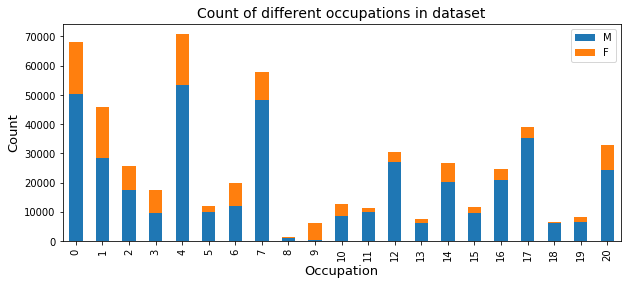

In [29]:
men = bf[bf.Gender == 'M']['Occupation'].value_counts(sort=False)
women = bf[bf.Gender == 'F']['Occupation'].value_counts(sort=False)
pd.DataFrame({'M': men, 'F': women}, index=range(0,21)).plot.bar(stacked=True)
plt.gcf().set_size_inches(10, 4)
plt.title("Count of different occupations in dataset", size=14)
plt.legend(loc="upper right")
plt.xlabel('Occupation', size=13)
plt.ylabel('Count', size=13)
plt.show()


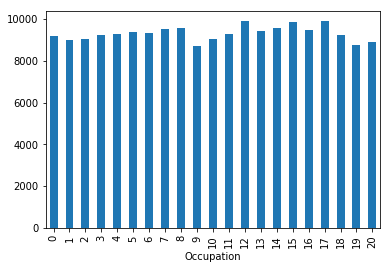

In [42]:
pd.pivot_table(bf,index='Occupation',aggfunc='mean')['Purchase'].plot(kind='bar')

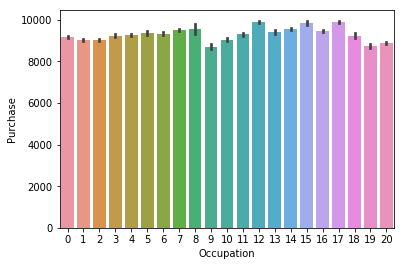

In [39]:
sns.barplot(bf['Occupation'],bf['Purchase'])

In [30]:
import random
color_mapping = {}
def random_color(val):    
    if val in color_mapping.keys():
        color = color_mapping[val]
    else:
        r = lambda: random.randint(0,255)
        color = 'rgba({}, {}, {}, 0.4)'.format(r(), r(), r())
        color_mapping[val] = color
    return 'background-color: %s' % color

occ_product_gb = bf[['Occupation', 'Product_ID', 'Purchase']].groupby(['Occupation', 'Product_ID']).agg('count').rename(columns={'Purchase': 'count'})
occ_product_gb.sort_values('count', inplace=True, ascending=False)
result = pd.DataFrame({
    x: list(occ_product_gb.loc[x].index)[:5] for x in range(21)
}, index=['#{}'.format(x) for x in range(1,6)])
display(result.style.applymap(random_color))

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
#1,P00265242,P00265242,P00265242,P00265242,P00265242,P00265242,P00265242,P00265242,P00112142,P00034742,P00145042,P00265242,P00057642,P00265242,P00265242,P00025442,P00265242,P00057642,P00265242,P00265242,P00265242
#2,P00110742,P00220442,P00025442,P00117942,P00110742,P00114942,P00058042,P00110742,P00242742,P00117442,P00242742,P00059442,P00265242,P00010742,P00184942,P00110742,P00046742,P00112142,P00010742,P00058042,P00059442
#3,P00025442,P00110742,P00058042,P00025442,P00112142,P00251242,P00110742,P00025442,P00117942,P00265242,P00112142,P00025442,P00112142,P00317842,P00025442,P00265242,P00034742,P00025442,P00058042,P00237542,P00220442
#4,P00057642,P00025442,P00110842,P00110842,P00237542,P00110742,P00031042,P00112142,P00114942,P00000142,P00025442,P00110942,P00025442,P00080342,P00237542,P00110942,P00058042,P00110742,P00080342,P00059442,P00110742
#5,P00112142,P00059442,P00059442,P00110742,P00025442,P00057642,P00255842,P00184942,P00127842,P00102642,P00255842,P00112142,P00237542,P00085242,P00148642,P00059442,P00255842,P00117942,P00184942,P00145042,P00025442


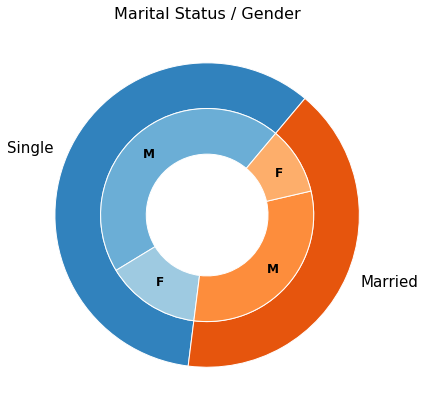

In [31]:
out_vals = bf.Marital_Status.value_counts()
in_vals = np.array([bf[bf.Marital_Status==x]['Gender'].value_counts() for x in [0,1]]).flatten()

fig, ax = plt.subplots(figsize=(7, 7))

size = 0.3
cmap = plt.get_cmap("tab20c")
outer_colors = cmap(np.arange(2)*4)
inner_colors = cmap(np.array([1, 2, 5, 6]))

ax.pie(out_vals, radius=1, colors=outer_colors,
       wedgeprops=dict(width=size, edgecolor='w'), labels=['Single', 'Married'],
       textprops={'fontsize': 15}, startangle=50)

ax.pie(in_vals, radius=1-size, colors=inner_colors,
       wedgeprops=dict(width=size, edgecolor='w'), labels=['M', 'F', 'M', 'F'],
       labeldistance=0.75, textprops={'fontsize': 12, 'weight': 'bold'}, startangle=50)

ax.set(aspect="equal")
plt.title('Marital Status / Gender', fontsize=16)
plt.show()

In [33]:
users

NameError: name 'users' is not defined

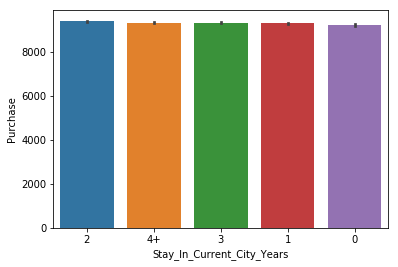

In [38]:
sns.barplot(bf['Stay_In_Current_City_Years'],bf['Purchase'])

In [4]:
pc1=pd.pivot_table(bf,index=['Product_Category_1'],aggfunc=('mean','sum','count'))['Purchase']

In [5]:
pc1.sort_index()

,count,mean,sum
Product_Category_1,,,
1,138353.0,13607.701495,1.882666e+09
2,23499.0,11255.680752,2.644972e+08
3,19849.0,10096.841705,2.004122e+08
4,11567.0,2328.862886,2.693796e+07
5,148592.0,6238.004045,9.269175e+08
6,20164.0,15837.893573,3.193553e+08
7,3668.0,16373.830153,6.005921e+07
8,112132.0,7497.354850,8.406934e+08
9,404.0,15538.297030,6.277472e+06


In [5]:
bf['Product_ID'].value_counts().sort_values(ascending=False)

P00265242    1858
P00110742    1591
P00025442    1586
P00112142    1539
P00057642    1430
P00184942    1424
P00046742    1417
P00058042    1396
P00059442    1384
P00145042    1384
P00237542    1374
P00255842    1354
P00117942    1346
P00110942    1336
P00010742    1331
P00110842    1260
P00220442    1253
P00051442    1233
P00102642    1228
P00117442    1227
P00278642    1213
P00242742    1194
P00034742    1188
P00080342    1186
P00148642    1179
P00028842    1172
P00031042    1168
P00251242    1167
P00114942    1162
P00270942    1141
             ... 
P00104342       1
P00203242       1
P00336242       1
P00073342       1
P00305442       1
P00107842       1
P00068342       1
P00070142       1
P00022042       1
P00056642       1
P0097642        1
P00315142       1
P00074542       1
P00364542       1
P00339142       1
P00206942       1
P00068742       1
P00133042       1
P00341542       1
P00329842       1
P00295642       1
P00013842       1
P00206242       1
P00353042       1
P00169842 

In [5]:
p = d = q = bf[['Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category_1','Purchase']]

In [4]:
bf.columns


Index(['User_ID', 'Product_ID', 'Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category_1',
       'Product_Category_2', 'Product_Category_3', 'Purchase'],
      dtype='object')

In [19]:

import warnings 
warnings.filterwarnings('ignore')

import itertools

pdq = list(itertools.product(p,d,q))
comb = pd.DataFrame(pdq)
comb.to_csv('combinations.csv')

In [31]:
Purfreq = bf.shape[0]/bf['User_ID'].nunique()
Purfreq = np.round(Purfreq,2)
Purfreq
# Purfreq_yr = Purfreq*365
# Purfreq_yr

91.25

In [32]:
Time_Between_Purchases = 24/91.25394669835342
Time_Between_Purchases = Time_Between_Purchases*60
Time_Between_Purchases = np.round(Time_Between_Purchases,2)
Time_Between_Purchases

15.78

In [33]:
Average_Order_Value = bf['Purchase'].sum()/bf.shape[0]
Average_Order_Value = np.round(Average_Order_Value,2)
Average_Order_Value

9333.86

In [35]:
Cust_value = Average_Order_Value * Purfreq
Cust_value = np.round(Cust_value,2)
Cust_value

851714.73

In [22]:
Cust_value_yr = Average_Order_Value * Purfreq_yr
Cust_value_yr

NameError: name 'Purfreq_yr' is not defined

In [37]:
overall = pd.DataFrame([Purfreq,Time_Between_Purchases,Average_Order_Value,Cust_value],columns=['Metrics'],index=['Purchase frequency','Time_Between_Purchases_in_mins','Average_Order_Value','Customer_value'])
overall
                                                                                              

,Metrics
Purchase frequency,91.25
Time_Between_Purchases_in_mins,15.78
Average_Order_Value,9333.86
Customer_value,851714.73


In [38]:
bf.columns

Index(['User_ID', 'Product_ID', 'Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category_1',
       'Product_Category_2', 'Product_Category_3', 'Purchase'],
      dtype='object')

In [7]:
bf.Purchase[bf.Gender == 'M'].sum()

3853044357

In [ ]:
bf.Purchase.

In [7]:
bf.Purchase[bf.Gender == 'F'].sum()

1164624021

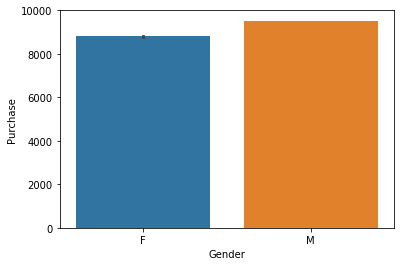

In [4]:
sns.barplot(x=bf.Gender,y=bf.Purchase);

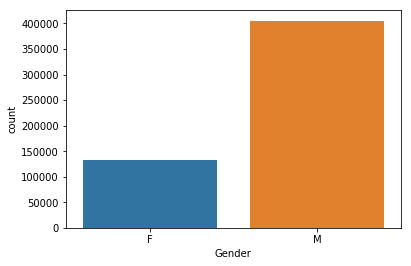

In [4]:
sns.countplot(bf.Gender)

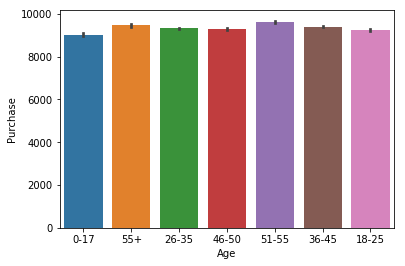

In [5]:
sns.barplot(x=bf.Age,y=bf.Purchase);

In [13]:
upbf = pd.pivot_table(bf,index=['User_ID','Product_ID'],aggfunc='mean')
upbf.index

MultiIndex(levels=[[1000001, 1000002, 1000003, 1000004, 1000005, 1000006, 1000007, 1000008, 1000009, 1000010, 1000011, 1000012, 1000013, 1000014, 1000015, 1000016, 1000017, 1000018, 1000019, 1000020, 1000021, 1000022, 1000023, 1000024, 1000025, 1000026, 1000027, 1000028, 1000029, 1000030, 1000031, 1000032, 1000033, 1000034, 1000035, 1000036, 1000037, 1000039, 1000041, 1000042, 1000043, 1000044, 1000045, 1000046, 1000047, 1000048, 1000049, 1000050, 1000051, 1000052, 1000053, 1000054, 1000055, 1000056, 1000057, 1000058, 1000059, 1000060, 1000061, 1000062, 1000063, 1000064, 1000065, 1000066, 1000067, 1000068, 1000069, 1000070, 1000071, 1000072, 1000073, 1000074, 1000075, 1000076, 1000077, 1000078, 1000079, 1000080, 1000081, 1000082, 1000083, 1000084, 1000085, 1000086, 1000087, 1000088, 1000089, 1000090, 1000091, 1000092, 1000093, 1000094, 1000095, 1000096, 1000097, 1000098, 1000099, 1000100, 1000101, 1000102, 1000103, 1000104, 1000105, 1000106, 1000107, 1000108, 1000109, 1000110, 1000111,

In [46]:
product = upbf.sort_values(by = 'Product_Category_1',ascending=False )
product

Product_Category_1  Product_ID
18                  P0094442       2715.936170
                    P00271442      2973.204082
                    P00020542      2301.250000
                    P00037442      2529.412162
                    P00040342      2056.000000
                    P00054042      3041.924399
                    P00058642      3221.435115
                    P00068442      2944.011111
                    P00090442      2572.666667
                    P00090742      2226.750000
                    P00112042      3099.142857
                    P00117542      3167.130755
                    P00119242      3219.940928
                    P00174942      2621.666667
                    P00269042      2432.285714
                    P00220942      2882.784810
                    P00271542      2886.169231
                    P00327642      3132.125628
                    P00356442      2397.258065
                    P00355042      2505.342857
                    P00344142

In [ ]:
upbf.groupby('')

In [5]:
pbf = pd.pivot_table(bf,index=['Product_ID'],aggfunc=pd.Series.nunique)

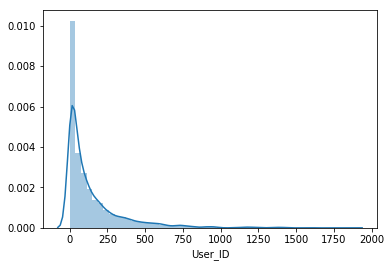

In [6]:
product1 = pbf.sort_values(by = 'User_ID',ascending=False )[['User_ID']]
sns.distplot(product1['User_ID'])

In [9]:
product['peoplewhobought'] = product.index.map(product1['User_ID'])

In [24]:
product['Price paid per person'] = product.Purchase/product.peoplewhobought
product.sort_values('Price paid per person',ascending=False)

,Purchase,peoplewhobought,Price paid per person
Product_ID,,,
P00086242,5707828,268,21297.865672
P00085342,11378642,542,20993.804428
P00200642,5345079,261,20479.229885
P00116142,12839872,627,20478.264753
P00119342,6218106,304,20454.296053
P00117642,7935907,388,20453.368557
P00074542,20323,1,20323.000000
P00341542,20291,1,20291.000000
P00052842,19492434,968,20136.811983


In [34]:
gbf = pd.pivot_table(bf,index=['Gender','Marital_Status'],aggfunc='sum')

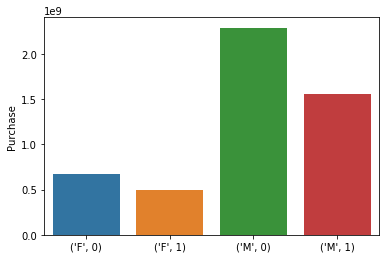

In [36]:
gbf1 = gbf.loc[['M','F']][['Purchase']]
sns.barplot(gbf1.index,gbf1['Purchase'])

In [3]:
gbfsum = pd.pivot_table(bf,index=['Gender'],aggfunc='mean')
gbfsum.Purchase

Gender
F    8809.761349
M    9504.771713
Name: Purchase, dtype: float64

In [21]:
abf = pd.pivot_table(bf,index=['Age'],aggfunc=pd.Series.nunique)
abf.User_ID

Age
0-17      218
18-25    1069
26-35    2053
36-45    1167
46-50     531
51-55     481
55+       372
Name: User_ID, dtype: int64

In [26]:
abfsum = pd.pivot_table(bf,index=['Age'],aggfunc='mean')
abfsum.Purchase

Age
0-17     9020.126878
18-25    9235.197575
26-35    9314.588970
36-45    9401.478758
46-50    9284.872277
51-55    9620.616620
55+      9453.898579
Name: Purchase, dtype: float64

In [22]:
agbf = pd.pivot_table(bf,index=['Gender','Age'],aggfunc=pd.Series.nunique)
agbf.User_ID

Gender  Age  
F       0-17       78
        18-25     287
        26-35     545
        36-45     333
        46-50     182
        51-55     142
        55+        99
M       0-17      140
        18-25     782
        26-35    1508
        36-45     834
        46-50     349
        51-55     339
        55+       273
Name: User_ID, dtype: int64

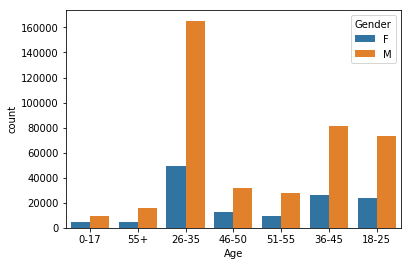

In [15]:
sns.countplot(bf['Age'],hue=bf['Gender'])

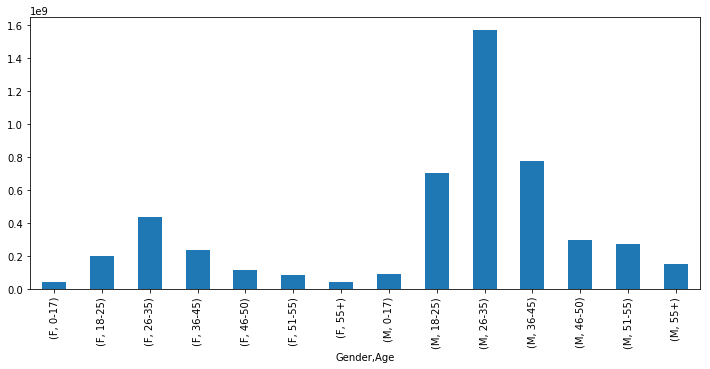

In [31]:
agbfsum = pd.pivot_table(bf,index=['Gender','Age'],aggfunc='sum')
agbfsum.Purchase.plot(kind='bar',figsize=(12,5))

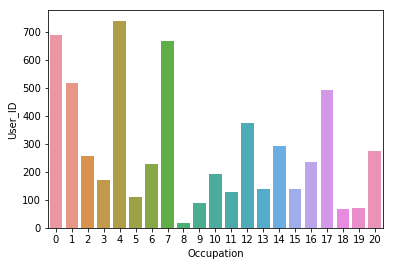

In [46]:
occount = pd.pivot_table(bf,index=['Occupation'],aggfunc=pd.Series.nunique)
sns.barplot(occount.index,occount.User_ID);

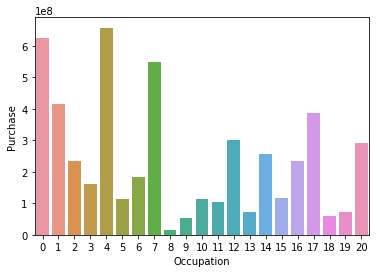

In [58]:
occsum = pd.pivot_table(bf,index=['Occupation'],aggfunc='sum')
sns.barplot(occsum.index,occsum.Purchase);


In [44]:
bf[bf['Product_Category_1']==1 and bf['Product_Category_2']==2]

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [25]:
upbf = pd.pivot_table(bf,index=['User_ID','Product_ID'],aggfunc='sum')[['Purchase']]
upbf.sort_values('Purchase',ascending=False)

,,Purchase
User_ID,Product_ID,
1001474,P00052842,23961
1003160,P00052842,23961
1002272,P00052842,23961
1005596,P00117642,23960
1003045,P00052842,23960
1001577,P00052842,23960
1005848,P00119342,23960
1003947,P00116142,23959
1001387,P00086242,23959


In [42]:
prodcount =  pd.pivot_table(bf,index=['Product_Category_1','Product_Category_2','Product_Category_3'],aggfunc=pd.Series.nunique)
prodcount

Age  City_Category  \
Product_Category_1 Product_Category_2 Product_Category_3                       
1                  2.0                3.0                   7              3   
                                      4.0                   7              3   
                                      5.0                   7              3   
                                      6.0                   7              3   
                                      8.0                   7              3   
                                      9.0                   7              3   
                                      11.0                  7              3   
                                      13.0                  7              3   
                                      14.0                  7              3   
                                      15.0                  7              3   
                                      16.0                  7              3   
                                      17.0                  7              3   
                                      18.0                  7              3   
                   3.0                4.0                   7              3   
                   4.0                9.0                   7              3   
                   5.0                6.0                   7              3   
                                      8.0                   7              3   
                                      9.0                   6              3   
                                      12.0                  7              3   
                                      14.0                  7              3   
                                      15.0                  7              3   
                                      17.0                  7              3   
                                      18.0                  7              3   
                   6.0                8.0                   7              3   
                                      13.0                  7              3   
                                      14.0                  7              3   
                                      15.0                  7              3   
                                      16.0                  7              3   
                   8.0                9.0                   7              3   
                                      13.0                  7              3   
...                                                       ...            ...   
6                  8.0                13.0                  7              3   
                                      14.0                  7              3   
                                      15.0                  7              3   
                                      16.0                  7              3   
                   10.0               13.0                  7              3   
                                      16.0                  7              3   
                   11.0               13.0                  7              3   
                                      16.0                  7              3   
8                  9.0                14.0                  7              3   
                   10.0               16.0                  6              3   
                   11.0               16.0                  5              3   
                   12.0               17.0                  7              3   
                   13.0               14.0                  7              3   
                                      15.0                  7              3   
                                      16.0                  7              3   
                   14.0               15.0                  6              3   
                                      16.0                  7              3   
                                      17.0                

In [16]:
prodcount.User_ID.sum()

106016

In [23]:
occpurchase =  pd.pivot_table(bf,index=['Age','Occupation'],aggfunc='sum').sort_values(by = 'Purchase',ascending=False)['Purchase']
occpurchase

Age    Occupation
18-25  4             436518213
26-35  0             307977307
       7             218826393
       4             200481491
36-45  7             174621962
26-35  1             166002573
       17            165670680
       12            147648394
       14            124228192
36-45  0             123192302
26-35  20            120286113
       2             113699330
36-45  17             96376007
0-17   10             95728496
36-45  1              82341827
18-25  0              82053195
36-45  16             73205800
26-35  3              71745646
36-45  20             66965420
       12             65785516
26-35  6              65737974
       15             64895979
46-50  7              63176388
26-35  16             62658307
46-50  1              62357670
26-35  5              56849330
36-45  14             54292161
51-55  7              52652456
26-35  11             45716014
18-25  20             45605691
                       ...    
36-45  13            

In [55]:
bf.columns

Index(['User_ID', 'Product_ID', 'Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category_1',
       'Product_Category_2', 'Product_Category_3', 'Purchase'],
      dtype='object')

In [34]:
uc = bf.groupby(by='User_ID').agg(pd.Series.nunique)
# uc

In [35]:
gen = bf.groupby('User_ID').mean()
gen = gen.drop(['Product_Category_1','Product_Category_2','Product_Category_3'],axis=1)
gen['Products'] = uc['Product_ID']
gen['no.of.categories'] = uc['Product_Category_1']
gen
df = bf.copy()
df = pd.get_dummies(df[['Gender','Age','Stay_In_Current_City_Years','City_Category']])
df['User_ID'] = bf.User_ID
df = df.groupby('User_ID').mean()

users = gen.join(df)
users.sort_values('Products',ascending=False)

,Occupation,Marital_Status,Purchase,Products,no.of.categories,Gender_F,Gender_M,Age_0-17,Age_18-25,Age_26-35,...,Age_51-55,Age_55+,Stay_In_Current_City_Years_0,Stay_In_Current_City_Years_1,Stay_In_Current_City_Years_2,Stay_In_Current_City_Years_3,Stay_In_Current_City_Years_4+,City_Category_A,City_Category_B,City_Category_C
User_ID,,,,,,,,,,,,,,,,,,,,,
1001680,20.0,1.0,8487.055610,1025,17,0,1,0,0,1,...,0,0,0,0,0,1,0,1,0,0
1004277,16.0,0.0,10773.806748,978,18,0,1,0,0,0,...,0,0,1,0,0,0,0,1,0,0
1001941,17.0,0.0,7591.863029,898,16,0,1,0,0,0,...,0,0,0,1,0,0,0,1,0,0
1001181,7.0,1.0,7419.162602,861,18,0,1,0,0,0,...,0,0,0,0,0,1,0,1,0,0
1000889,20.0,0.0,6690.768856,822,18,0,1,0,0,0,...,0,0,0,1,0,0,0,1,0,0
1003618,17.0,1.0,7783.272846,766,16,0,1,0,0,0,...,0,1,0,0,0,0,1,1,0,0
1001150,20.0,0.0,6288.473404,752,16,1,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0
1001015,3.0,1.0,8810.963464,739,18,0,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
1002909,7.0,0.0,10568.347280,717,18,0,1,0,0,1,...,0,0,0,1,0,0,0,1,0,0


In [15]:
users1['clusters'] = ulabels


In [9]:
users1 = pd.get_dummies(users)
# users1

In [7]:
users.Occupation = users.Occupation.astype('category')
users.Marital_Status = users.Marital_Status.astype('category')
# users.clusters = users.clusters.astype('int')
users.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5891 entries, 1000001 to 1006040
Data columns (total 22 columns):
Occupation                       5891 non-null category
Marital_Status                   5891 non-null category
Purchase                         5891 non-null float64
Products                         5891 non-null int64
no.of.categories                 5891 non-null int64
Gender_F                         5891 non-null uint8
Gender_M                         5891 non-null uint8
Age_0-17                         5891 non-null uint8
Age_18-25                        5891 non-null uint8
Age_26-35                        5891 non-null uint8
Age_36-45                        5891 non-null uint8
Age_46-50                        5891 non-null uint8
Age_51-55                        5891 non-null uint8
Age_55+                          5891 non-null uint8
Stay_In_Current_City_Years_0     5891 non-null uint8
Stay_In_Current_City_Years_1     5891 non-null uint8
Stay_In_Current_City_Years_2

In [77]:
cust = bf.groupby(by='User_ID').sum()
# cust

In [7]:
bf1 = pd.get_dummies(bf.drop(['User_ID','Product_ID'],axis=1))
bf1

,Occupation,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase,Gender_F,Gender_M,Age_0-17,Age_18-25,...,Age_51-55,Age_55+,City_Category_A,City_Category_B,City_Category_C,Stay_In_Current_City_Years_0,Stay_In_Current_City_Years_1,Stay_In_Current_City_Years_2,Stay_In_Current_City_Years_3,Stay_In_Current_City_Years_4+
0,10,0,3,NaN,NaN,8370,1,0,1,0,...,0,0,1,0,0,0,0,1,0,0
1,10,0,1,6.0,14.0,15200,1,0,1,0,...,0,0,1,0,0,0,0,1,0,0
2,10,0,12,NaN,NaN,1422,1,0,1,0,...,0,0,1,0,0,0,0,1,0,0
3,10,0,12,14.0,NaN,1057,1,0,1,0,...,0,0,1,0,0,0,0,1,0,0
4,16,0,8,NaN,NaN,7969,0,1,0,0,...,0,1,0,0,1,0,0,0,0,1
5,15,0,1,2.0,NaN,15227,0,1,0,0,...,0,0,1,0,0,0,0,0,1,0
6,7,1,1,8.0,17.0,19215,0,1,0,0,...,0,0,0,1,0,0,0,1,0,0
7,7,1,1,15.0,NaN,15854,0,1,0,0,...,0,0,0,1,0,0,0,1,0,0
8,7,1,1,16.0,NaN,15686,0,1,0,0,...,0,0,0,1,0,0,0,1,0,0
9,20,1,8,NaN,NaN,7871,0,1,0,0,...,0,0,1,0,0,0,1,0,0,0


# FM score

In [3]:
rfmTable = bf.groupby('User_ID').agg({'User_ID': lambda x: len(x),'Purchase': lambda x: x.sum()})

rfmTable.rename(columns={'User_ID': 'frequency','Purchase': 'monetary'}, inplace=True)

rfmTable.head()

,frequency,monetary
User_ID,,
1000001,34,333481
1000002,76,810353
1000003,29,341635
1000004,13,205987
1000005,106,821001


In [4]:
# rfmTable.sort_values(['frequency','monetary'],ascending=False,inplace=True)
rfmTable.tail()

,frequency,monetary
User_ID,,
1006036,476,3821666
1006037,116,1075037
1006038,10,80859
1006039,67,554504
1006040,169,1562615


In [5]:
rfmTable['freqscore'] = pd.cut(rfmTable['frequency'],5,labels=[1,2,3,4,5])
rfmTable['monscore'] = pd.cut(rfmTable['monetary'],5,labels=[1,2,3,4,5])

In [6]:
rfmTable['monscore'].value_counts()

1    5364
2     456
3      62
4       7
5       2
Name: monscore, dtype: int64

In [7]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4).fit(rfmTable[['freqscore', 'monscore']])
centroids = kmeans.cluster_centers_
print(centroids)



[[1.         1.00381243]
 [3.21582734 2.57553957]
 [2.         2.00543478]
 [2.         1.        ]]


In [8]:
labels = kmeans.labels_
labels

array([0, 0, 0, ..., 0, 0, 0])

In [9]:
rfmTable['clusters'] = labels
rfmTable[rfmTable['clusters']==1]
rfmTable.clusters.value_counts()
# rfmTable

0    5246
2     368
1     139
3     138
Name: clusters, dtype: int64

In [10]:
a = rfmTable[(rfmTable['freqscore']==3) & (rfmTable['monscore']==3)].count()
a
b = rfmTable[(rfmTable['freqscore']>3) & (rfmTable['monscore']>3)]
b
# c = rfmTable[(rfmTable['freqscore']<3) & (rfmTable['monscore']<3)].count()
# rfmdict = {'freq = 3 & monetary = 3':a,'freq > 3 & monetary > 3':b,'freq < 3 & monetary < 3':c}
# fmdf = pd.DataFrame(rfmdict,index=['count','count','count'])
# fmdf
rfmTable

,frequency,monetary,freqscore,monscore,clusters
User_ID,,,,,
1000001,34,333481,1,1,0
1000002,76,810353,1,1,0
1000003,29,341635,1,1,0
1000004,13,205987,1,1,0
1000005,106,821001,1,1,0
1000006,46,379450,1,1,0
1000007,16,234427,1,1,0
1000008,76,796545,1,1,0
1000009,57,593960,1,1,0


In [11]:
import plotly.express as px
px.scatter(rfmTable,'frequency','monetary',color='clusters')
# plt.scatter(rfmTable['frequency'],rfmTable['monetary'],c = labels)
# plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')


In [154]:
# import plotly
# plotly.tools.set_credentials_file(username='Shyam4801', api_key='FbsutZ57vnERAlGdbfAY')


# import plotly.plotly as py
import plotly.graph_objs as go
go.scatter(rfmTable,'frequency','monetary',color='clusters')


fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-scatter-colorscale')

TypeError: 'module' object is not callable

In [147]:
bf.shape

(537577, 12)

In [75]:
rfmTable['clusters'].value_counts()


0    5246
2     368
1     139
3     138
Name: clusters, dtype: int64

In [88]:
np.array(rfmTable[rfmTable['clusters']==1].index)
# s

array([1000195, 1000216, 1000245, 1000302, 1000319, 1000329, 1000352,
       1000424, 1000482, 1000524, 1000531, 1000549, 1000550, 1000678,
       1000710, 1000752, 1000770, 1000839, 1000869, 1000881, 1000889,
       1001010, 1001015, 1001019, 1001051, 1001088, 1001117, 1001150,
       1001181, 1001203, 1001285, 1001317, 1001340, 1001383, 1001425,
       1001447, 1001448, 1001449, 1001579, 1001605, 1001613, 1001632,
       1001635, 1001647, 1001676, 1001680, 1001733, 1001737, 1001835,
       1001837, 1001880, 1001899, 1001912, 1001941, 1001958, 1001980,
       1002015, 1002063, 1002106, 1002116, 1002181, 1002304, 1002507,
       1002529, 1002665, 1002777, 1002793, 1002820, 1002857, 1002907,
       1002909, 1003029, 1003032, 1003067, 1003224, 1003272, 1003292,
       1003311, 1003391, 1003401, 1003471, 1003507, 1003526, 1003539,
       1003618, 1003626, 1003650, 1003675, 1003705, 1003778, 1003792,
       1003808, 1003824, 1003829, 1003841, 1004021, 1004041, 1004048,
       1004064, 1004

In [41]:
kmeans.cluster_centers_

array([[1.        , 1.00381243],
       [2.15981735, 2.00456621],
       [2.        , 1.        ],
       [3.43478261, 3.15942029]])

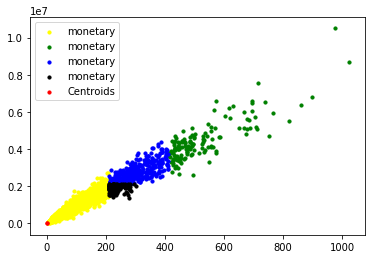

In [76]:
#Visualising the clusters
plt.scatter(rfmTable[labels == 0].iloc[:,0], rfmTable[labels == 0].iloc[:,1], s = 10, c = 'yellow')
plt.scatter(rfmTable[labels == 1].iloc[:,0], rfmTable[labels == 1].iloc[:,1], s = 10, c = 'green')
plt.scatter(rfmTable[labels == 2].iloc[:,0], rfmTable[labels == 2].iloc[:,1], s = 10, c = 'blue')
plt.scatter(rfmTable[labels == 3].iloc[:,0], rfmTable[labels == 3].iloc[:,1], s = 10, c = 'black')

#Plotting the centroids of the clusters
plt.scatter(kmeans.cluster_centers_[0], kmeans.cluster_centers_[1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

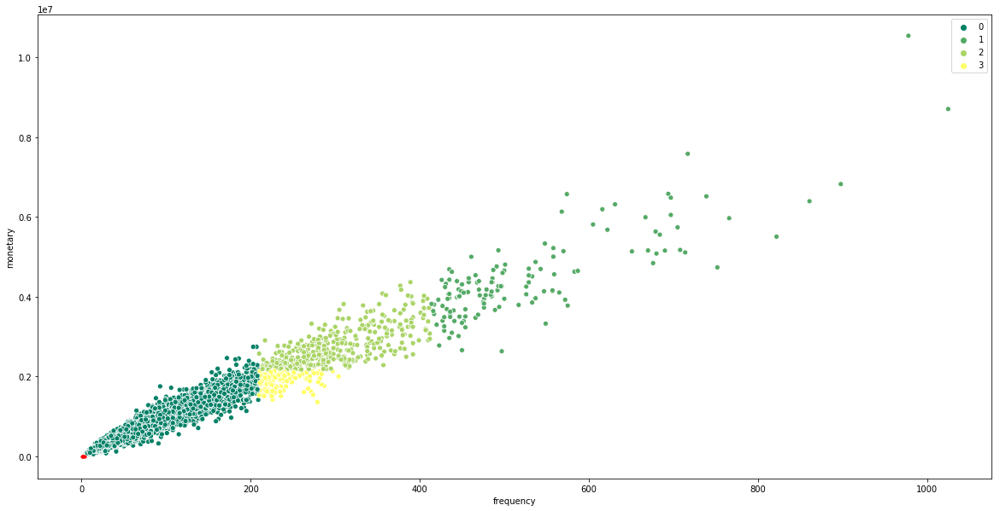

In [77]:
plt.figure(figsize=(20,10))
sns.scatterplot(rfmTable['frequency'],rfmTable['monetary'],hue=labels,palette='summer')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')


In [13]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=10).fit(users_scaled)
centroids = kmeans.cluster_centers_
print(centroids)

ulabels = kmeans.labels_
ulabels

[[-2.61107111e-01 -1.01051314e-01 -1.20248151e-01  1.59248686e+00
  -1.59248686e+00 -1.96029691e-01 -2.42393339e-01  4.07886369e-02
   1.12198520e-01  1.64211066e-01  9.10423544e-02 -2.33796030e-02
  -2.03237601e-02  1.72990585e-02 -3.44731629e-02  3.40730961e-02
  -1.26514671e-03 -1.79607617e-02  2.31762900e-02 -7.32185119e-03
   2.62553711e-01  3.51477103e-01 -2.13143956e-01  3.70161180e-01
  -3.34283860e-01  7.27230774e-02  2.75024607e-01  3.93330065e-02
  -1.96499716e-03  5.26265357e-01 -1.83548689e-01 -9.18287813e-03
  -2.61108593e-01 -1.56024333e-01 -2.29190183e-01  1.43444058e-02
   2.82112803e-02 -3.01539261e-01 -8.10367783e-02 -3.74853212e-05
   1.19018023e-01 -1.44326902e-01  1.44326902e-01]
 [ 2.40602556e-01 -9.76362694e-02  7.04306983e-02 -3.56299638e-01
   3.56299638e-01 -1.81941133e-01 -7.05963206e-02  2.56554818e-01
   5.68182651e-02 -1.75680518e-02 -1.13639774e-01 -1.94014782e-01
  -1.00393077e-02  1.58971678e-02 -4.08702692e-02  5.36861066e-02
  -2.22195716e-02  7.1722

array([7, 3, 3, ..., 0, 0, 3])

In [80]:
# bf1

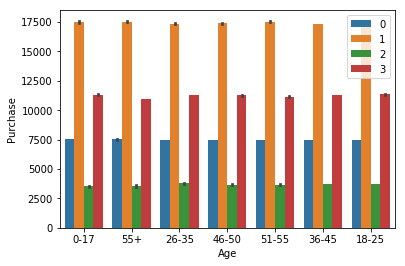

In [88]:
sns.barplot(y = bf['Purchase'], x = bf['Age'], hue=labels)
plt.show()

In [24]:
from sklearn.cluster import KMeans


wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(rfmTable[['freqscore', 'monscore']])
    wcss.append(kmeans.inertia_)

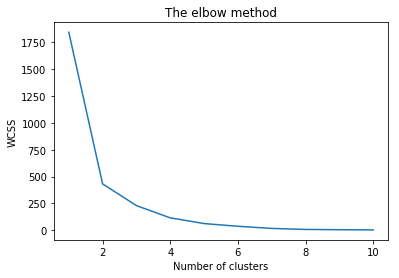

In [25]:
#Plotting the results onto a line graph, allowing us to observe 'The elbow'
plt.plot(range(1, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') #within cluster sum of squares
plt.show()

In [10]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
users_scaled = sc.fit_transform(users1)
users_scaled

C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


array([[ 0.03056136, -0.5405354 ,  0.31152088, ..., -0.22044003,
         0.85089772, -0.85089772],
       [ 0.47167651, -0.14401275, -1.09172847, ..., -0.22044003,
         0.85089772, -0.85089772],
       [ 1.0489579 , -0.58774048, -0.8110786 , ..., -0.22044003,
         0.85089772, -0.85089772],
       ...,
       [-0.85880257, -0.76711977, -1.65302821, ..., -0.22044003,
         0.85089772, -0.85089772],
       [-0.76054965, -0.22898189, -0.24977886, ..., -0.22044003,
        -1.17522938,  1.17522938],
       [-0.25964558,  0.73400169,  1.43412036, ..., -0.22044003,
         0.85089772, -0.85089772]])

In [11]:
from sklearn.cluster import KMeans

wcss = []

for i in range(1, 15):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(users_scaled)
    wcss.append(kmeans.inertia_)

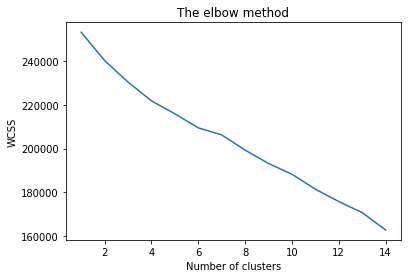

In [12]:
#Plotting the results onto a line graph, allowing us to observe 'The elbow'
plt.plot(range(1, 15), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') #within cluster sum of squares
plt.show()

In [44]:
# sns.scatterplot(bf['Age'],bf['Purchase'], hue=ulabels,palette='viridis');

In [17]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics


In [19]:
x = users1.drop(['clusters'],axis=1)
y = users1['clusters']

In [33]:
##Train test split
from sklearn.model_selection import train_test_split
seed = 7
np.random.seed(seed)

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state = 123)

In [34]:
print (X_train.shape, y_train.shape)
print (X_test.shape, y_test.shape)

(4123, 43) (4123,)
(1768, 43) (1768,)


In [35]:
sc = StandardScaler()
X_train_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.fit_transform(X_test)



C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)
C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [50]:
model1=DecisionTreeClassifier(min_samples_leaf=20,max_depth=4)

model1.fit(X_train_scaled, y_train)
preds = model1.predict(X_test_scaled)

In [51]:
#Confusion matrix
#Predict for train set


from sklearn.metrics import classification_report,confusion_matrix
mat_train = confusion_matrix(y_test,preds)

print("confusion matrix = \n",mat_train)

confusion matrix = 
 [[359   0   0   0   0   0   6   0   0   0]
 [ 14   0   0  55   0  48   0   0   0   0]
 [  0   0  23  26   0  20   0   0   0   0]
 [  0   0   0 344   0   0   0   0   0   0]
 [ 13   0   0   0 136   0   0   0   0   0]
 [  0   0   0   0   0 307   0   0   0   0]
 [  0   0   0   0   0   0 221   0   0   0]
 [ 25   0   0  44   0   1   2   0   0   0]
 [  0   0   0  34   0  24   0   0  23   0]
 [  9   0   0  10   0  24   0   0   0   0]]


In [53]:
print(classification_report(y_train,model1.predict(X_train)))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       714
           1       0.00      0.00      0.00       259
           2       0.00      0.00      0.00       187
           3       0.22      1.00      0.36       899
           4       0.00      0.00      0.00       342
           5       0.00      0.00      0.00       746
           6       0.00      0.00      0.00       499
           7       0.00      0.00      0.00       167
           8       0.00      0.00      0.00       213
           9       0.00      0.00      0.00        97

   micro avg       0.22      0.22      0.22      4123
   macro avg       0.02      0.10      0.04      4123
weighted avg       0.05      0.22      0.08      4123



C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [52]:
print(classification_report(y_test,preds))

              precision    recall  f1-score   support

           0       0.85      0.98      0.91       365
           1       0.00      0.00      0.00       117
           2       1.00      0.33      0.50        69
           3       0.67      1.00      0.80       344
           4       1.00      0.91      0.95       149
           5       0.72      1.00      0.84       307
           6       0.97      1.00      0.98       221
           7       0.00      0.00      0.00        72
           8       1.00      0.28      0.44        81
           9       0.00      0.00      0.00        43

   micro avg       0.80      0.80      0.80      1768
   macro avg       0.62      0.55      0.54      1768
weighted avg       0.72      0.80      0.73      1768



C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [44]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz

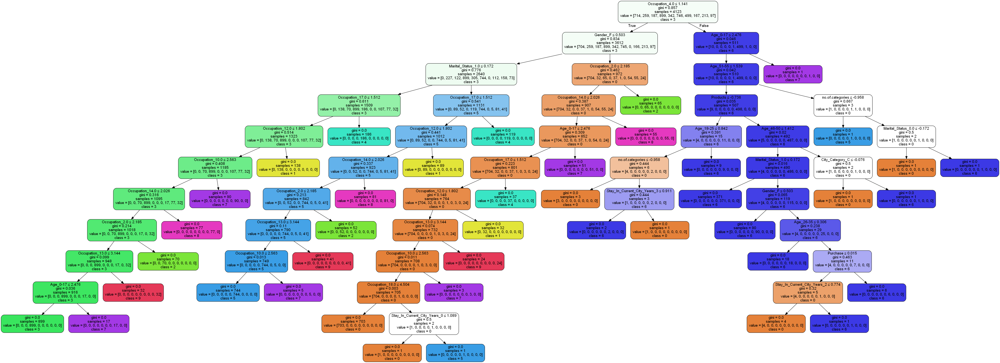

In [45]:
feature_cols = x.columns
dot_data = StringIO()
export_graphviz(model1, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1','2','3','4','5','6','7','8','9'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('bftree.png')
Image(graph.create_png())

In [27]:
users1['clusters'].value_counts()

3    1243
0    1079
5    1053
6     720
4     491
1     376
8     294
2     256
7     239
9     140
Name: clusters, dtype: int64

In [49]:
#9 Visualising the Test set results
from matplotlib.colors import ListedColormap
X_set, y_set = X_test_scaled, y_test
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1, stop = X_set[:, 0].max() + 1, step = 0.01),np.arange(start = X_set[:, 1].min() - 1, stop = X_set[:, 1].max() + 1, step = 0.01))
plt.contourf(X1, X2, model1.predict(np.array([X1.ravel(), X2.ravel()]).T).reshape(X1.shape),alpha = 0.75, cmap = ListedColormap(('red', 'green')))
plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())
for i, j in enumerate(np.unique(y_set)):
    plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
                c = ListedColormap(('red', 'green'))(i), label = j)
plt.title('Decision Tree Classification (Test set)')
plt.xlabel('Age')
plt.ylabel('Estimated Salary')
plt.legend()
plt.show()

ValueError: Number of features of the model must match the input. Model n_features is 43 and input n_features is 2 

In [50]:
bf2  = bf.copy()
bf2['clusters'] = labels
bf2[bf2['User_ID']==1000008]

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase,clusters
19,1000008,P00249542,M,26-35,12,C,4+,1,1,5.0,15.0,19614,0
20,1000008,P00220442,M,26-35,12,C,4+,1,5,14.0,NaN,8584,3
21,1000008,P00156442,M,26-35,12,C,4+,1,8,NaN,NaN,9872,2
22,1000008,P00213742,M,26-35,12,C,4+,1,8,NaN,NaN,9743,2
23,1000008,P00214442,M,26-35,12,C,4+,1,8,NaN,NaN,5982,3
24,1000008,P00303442,M,26-35,12,C,4+,1,1,8.0,14.0,11927,2
39199,1000008,P00084842,M,26-35,12,C,4+,1,8,16.0,NaN,9713,2
39200,1000008,P00237542,M,26-35,12,C,4+,1,1,15.0,16.0,19203,0
39201,1000008,P00054242,M,26-35,12,C,4+,1,1,6.0,14.0,15857,0
39202,1000008,P00003642,M,26-35,12,C,4+,1,8,NaN,NaN,7875,3


C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:448: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:448: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
C:\Users\Shyam Sundar\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, ou

<Figure size 1080x1080 with 0 Axes>

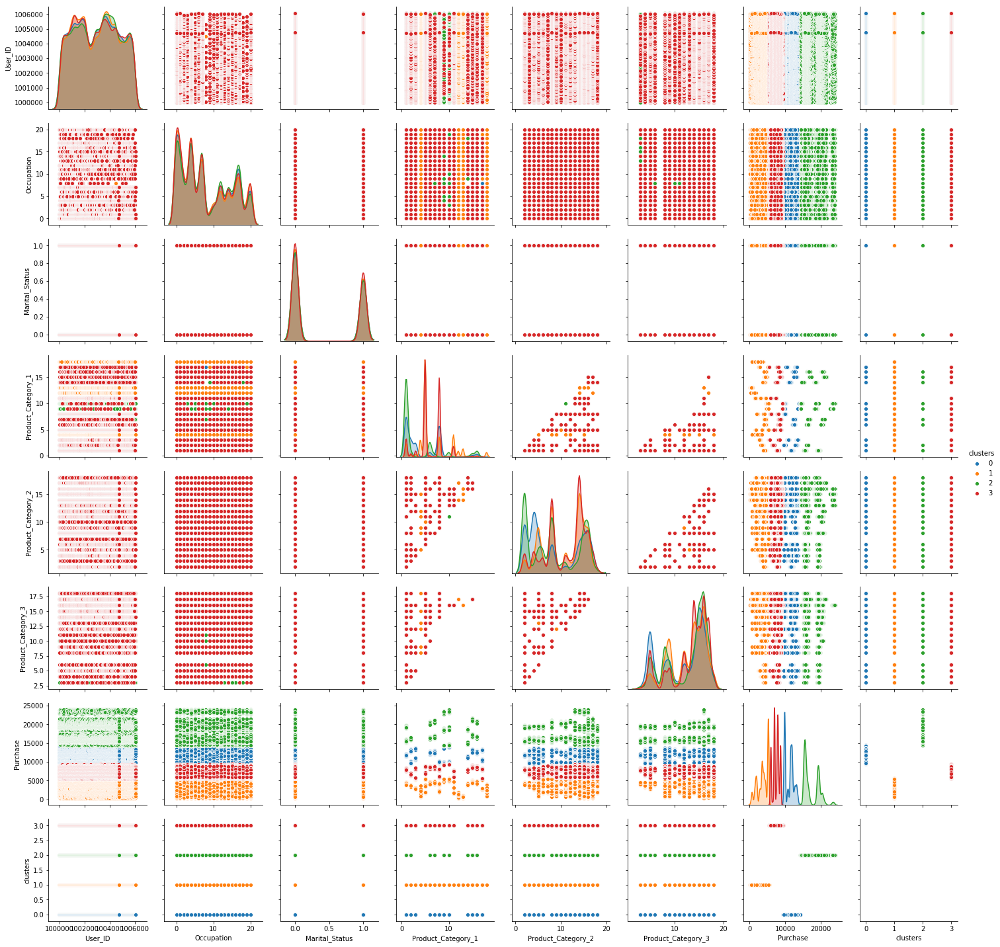

In [50]:
plt.figure(figsize=(15,15))
sns.pairplot(bf,hue='clusters')

In [12]:
pd.DataFrame(bf.nunique(),columns=['Unique_values'])

,Unique_values
User_ID,5891
Product_ID,3623
Gender,2
Age,7
Occupation,21
City_Category,3
Stay_In_Current_City_Years,5
Marital_Status,2
Product_Category_1,18
Product_Category_2,17


In [48]:
grouped = bf.groupby(['User_ID','Product_ID']).size().reset_index(name='count')
df =  grouped.sort_values('User_ID', ascending=False)

df.head()

,User_ID,Product_ID,count
537576,1006040,P00349442,1
537461,1006040,P00112442,1
537469,1006040,P00115842,1
537468,1006040,P00115742,1
537467,1006040,P00114942,1


In [30]:
basket = (df.groupby(['User_ID','Product_ID'])['count']
          .sum().unstack().reset_index().fillna(0)
          .set_index('User_ID'))

#The encoding function
#encoding function will convert all the postive values into 1 and negative values into 0
def encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1
    
#apply the function here for the dataset    
basket_sets = basket.applymap(encode_units)
# basket_sets

In [1]:
basket_sets.shape

NameError: name 'basket_sets' is not defined

In [31]:
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
import mlxtend as ml

In [62]:
frequent_itemsets = apriori(basket_sets, min_support=0.03, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="lift",min_threshold=1)
rules.sort_values('confidence', ascending = False, inplace = True)
rules.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
25666,"(P00057942, P00046742)",(P00110742),0.054320,0.270073,0.032083,0.590625,2.186909,0.017412,1.783028
23908,"(P00111742, P00110742)",(P00025442),0.052453,0.269224,0.030725,0.585761,2.175735,0.016603,1.764138
26696,"(P00270942, P00102642)",(P00057642),0.064335,0.242743,0.037685,0.585752,2.413052,0.022068,1.828028
27380,"(P00270942, P00329542)",(P00057642),0.056357,0.242743,0.032762,0.581325,2.394816,0.019082,1.808700
26474,"(P00057642, P00057942)",(P00110742),0.054490,0.270073,0.031234,0.573209,2.122421,0.016518,1.710267
27382,"(P00057642, P00329542)",(P00270942),0.057206,0.193685,0.032762,0.572700,2.956860,0.021682,1.887000
25730,"(P00062842, P00110742)",(P00046742),0.059582,0.240536,0.033441,0.561254,2.333341,0.019109,1.730985
24310,"(P00243942, P00112142)",(P00025442),0.054150,0.269224,0.030385,0.561129,2.084242,0.015807,1.665125
23018,"(P00010742, P00120042)",(P00110942),0.058394,0.226787,0.032762,0.561047,2.473896,0.019519,1.761493
29144,"(P0097242, P00120042)",(P00110942),0.056018,0.226787,0.031404,0.560606,2.471954,0.018700,1.759727


In [63]:
rules.to_excel('association_by_confidence.xlsx')

In [ ]:
rules.shape

In [67]:
frequent_itemsets.sort_values('support',ascending=False).head()

,support,itemsets
726,0.315396,(P00265242)
262,0.270073,(P00110742)
68,0.269224,(P00025442)
273,0.261246,(P00112142)
149,0.242743,(P00057642)


In [71]:
rules.sort_values('support', ascending = False).head()


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
2864,(P00025442),(P00110742),0.269224,0.270073,0.117637,0.436948,1.617890,0.044927,1.296377
2865,(P00110742),(P00025442),0.270073,0.269224,0.117637,0.435575,1.617890,0.044927,1.294726
12522,(P00112142),(P00110742),0.261246,0.270073,0.109998,0.421053,1.559033,0.039443,1.260783
12523,(P00110742),(P00112142),0.270073,0.261246,0.109998,0.407291,1.559033,0.039443,1.246403
2884,(P00025442),(P00112142),0.269224,0.261246,0.103887,0.385876,1.477062,0.033554,1.202940


In [73]:
# Association rules to find the lift value
rules1 = association_rules(frequent_itemsets, metric="lift", min_threshold=1)
rules1.sort_values('lift', ascending = False, inplace = True)
rules1.head(5)  

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
9621,(P00106742),(P00070942),0.081141,0.062977,0.030555,0.376569,5.979429,0.025445,1.503009
9620,(P00070942),(P00106742),0.062977,0.081141,0.030555,0.485175,5.979429,0.025445,1.784800
4293,(P00220142),(P00032042),0.072653,0.092344,0.033950,0.467290,5.060301,0.027241,1.703845
4292,(P00032042),(P00220142),0.092344,0.072653,0.033950,0.367647,5.060301,0.027241,1.466502
4269,(P00127442),(P00032042),0.089798,0.092344,0.041928,0.466919,5.056283,0.033636,1.702659


In [ ]:
These are the top 

In [8]:
x = bf1.drop(['Product_Category_2', 'Product_Category_3','Purchase'],axis=1)
y = bf1['Purchase']
x.Occupation = x.Occupation.astype('category')
x.Product_Category_1 = x.Product_Category_1.astype('category')

x = pd.get_dummies(x,drop_first=True)
x.columns

Index(['Marital_Status', 'Gender_F', 'Gender_M', 'Age_0-17', 'Age_18-25',
       'Age_26-35', 'Age_36-45', 'Age_46-50', 'Age_51-55', 'Age_55+',
       'City_Category_A', 'City_Category_B', 'City_Category_C',
       'Stay_In_Current_City_Years_0', 'Stay_In_Current_City_Years_1',
       'Stay_In_Current_City_Years_2', 'Stay_In_Current_City_Years_3',
       'Stay_In_Current_City_Years_4+', 'Occupation_1', 'Occupation_2',
       'Occupation_3', 'Occupation_4', 'Occupation_5', 'Occupation_6',
       'Occupation_7', 'Occupation_8', 'Occupation_9', 'Occupation_10',
       'Occupation_11', 'Occupation_12', 'Occupation_13', 'Occupation_14',
       'Occupation_15', 'Occupation_16', 'Occupation_17', 'Occupation_18',
       'Occupation_19', 'Occupation_20', 'Product_Category_1_2',
       'Product_Category_1_3', 'Product_Category_1_4', 'Product_Category_1_5',
       'Product_Category_1_6', 'Product_Category_1_7', 'Product_Category_1_8',
       'Product_Category_1_9', 'Product_Category_1_10',
      

In [14]:
##Train test split
from sklearn.model_selection import train_test_split
seed = 7
np.random.seed(seed)

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state = 123)

In [6]:
lr = LinearRegression()

In [25]:
model = lr.fit(x,y)
ypred = lr.predict(x)
ypred

array([ 9796.81152344, 13289.99853516,   997.94873047, ...,
        7911.33447266,  6669.52587891,  6669.52587891])

In [26]:
lr.score(x,y)

0.6311637911934022

In [28]:
metrics.mean_squared_error(y,ypred)

9151023.790834855

In [9]:
import statsmodels.api as sm
X = sm.add_constant(x)
model = sm.OLS(y,X).fit()
predictions = model.predict(X)

model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               Purchase   R-squared:                       0.631
Model:                            OLS   Adj. R-squared:                  0.631
Method:                 Least Squares   F-statistic:                 1.804e+04
Date:                Tue, 09 Jul 2019   Prob (F-statistic):               0.00
Time:                        12:14:29   Log-Likelihood:            -5.0713e+06
No. Observations:              537577   AIC:                         1.014e+07
Df Residuals:                  537525   BIC:                         1.014e+07
Df Model:                          51                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                         -7.977e+13   2.26e+14     -0.353      0.724   -5.23e+14    3.63e+14
Marital_Status                  -54.3529      9.033     -6.017      0.000     -72.057     -36.649
Gender_F                      -4.192e+13   1.26e+14     -0.332      0.740   -2.89e+14    2.05e+14
Gender_M                      -4.192e+13   1.26e+14     -0.332      0.740   -2.89e+14    2.05e+14
Age_0-17                      -2.833e+13   1.72e+14     -0.165      0.869   -3.65e+14    3.09e+14
Age_18-25                     -2.833e+13   1.72e+14     -0.165      0.869   -3.65e+14    3.09e+14
Age_26-35                     -2.833e+13   1.72e+14     -0.165      0.869   -3.65e+14    3.09e+14
Age_36-45                     -2.833e+13   1.72e+14     -0.165      0.869   -3.65e+14    3.09e+14
Age_46-50                     -2.833e+13   1.72e+14     -0.165      0.869   -3.65e+14    3.09e+14
Age_51-55                     -2.833e+13   1.72e+14     -0.165      0.869   -3.65e+14    3.09e+14
Age_55+                       -2.833e+13   1.72e+14     -0.165      0.869   -3.65e+14    3.09e+14
City_Category_A                1.436e+14   2.37e+14      0.605      0.545   -3.22e+14    6.09e+14
City_Category_B                1.436e+14   2.37e+14      0.605      0.545   -3.22e+14    6.09e+14
City_Category_C                1.436e+14   2.37e+14      0.605      0.545   -3.22e+14    6.09e+14
Stay_In_Current_City_Years_0   6.397e+12   3.49e+14      0.018      0.985   -6.77e+14     6.9e+14
Stay_In_Current_City_Years_1   6.397e+12   3.49e+14      0.018      0.985   -6.77e+14     6.9e+14
Stay_In_Current_City_Years_2   6.397e+12   3.49e+14      0.018      0.985   -6.77e+14     6.9e+14
Stay_In_Current_City_Years_3   6.397e+12   3.49e+14      0.018      0.985   -6.77e+14     6.9e+14
Stay_In_Current_City_Years_4+  6.397e+12   3.49e+14      0.018      0.985   -6.77e+14     6.9e+14
Occupation_1                    -30.9313     18.434     -1.678      0.093     -67.061       5.198
Occupation_2                     62.5084     22.178      2.818      0.005      19.040     105.976
Occupation_3                    248.8351     25.848      9.627      0.000     198.173     299.497
Occupation_4                    160.9473     17.630      9.129      0.000     126.394     195.501
Occupation_5                     51.3369     30.069      1.707      0.088      -7.598     110.272
Occupation_6                    211.8845     24.687      8.583      0.000     163.498     260.271
Occupation_7                    120.1760     17.308      6.943      0.000      86.253     154.099
Occupation_8                   -321.8984     78.650     -4.093      0.000    -476.050    -167.747
Occupation_9                    110.7632     41.023      2.700      0.007      30.360     191.167
Occupation_10                   -76.2580     

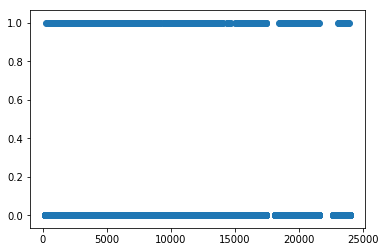

In [62]:
plt.scatter(bf['Purchase'],x['Occupation_18']);

In [15]:
clf = DecisionTreeRegressor(max_depth=9)


In [16]:
clf.fit(X_train,y_train)
tpred = clf.predict(X_test)
tpred


array([ 7431.97880265, 13696.36658356,  7431.97880265, ...,
        6380.80344828, 13696.36658356, 13696.36658356])

In [22]:
tpred.dtype

dtype('float64')

In [17]:
metrics.r2_score(y_test,tpred)

0.6057962410152613

In [58]:
from sklearn import metrics

metrics.mean_squared_error(y_test,tpred)

9749492.32477918

In [114]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.533265 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.533265 to fit



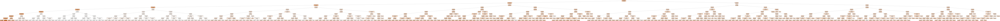

In [61]:
feature_cols = x.columns
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('bftree.png')
Image(graph.create_png())

In [53]:
dict_varimp = dict(zip(x.columns, np.round(rf.feature_importances_,3)))

In [54]:
df_varimp = pd.DataFrame.from_dict(dict_varimp, orient='index')

In [55]:
df_varimp = df_varimp.sort_values(by=0, ascending=False)
df_varimp

,0
Product_Category_1_5,0.210
Product_Category_1_8,0.154
Product_Category_1_11,0.140
Product_Category_1_4,0.131
Product_Category_1_13,0.088
Product_Category_1_12,0.058
Product_Category_1_18,0.036
Product_Category_1_3,0.028
Product_Category_1_10,0.018
Product_Category_1_2,0.017


In [23]:
mse = []
for i in [3, 4, 5,6,7,8]:
    clf = DecisionTreeRegressor(max_depth=i,min_samples_split=5)
    clf.fit(X_train,y_train)
    tpred = clf.predict(X_test)
    mse.append(metrics.mean_squared_error(y_test,tpred))


In [24]:
mse

[16046133.75385537,
 13726730.31754469,
 12221295.951594573,
 11164724.846401477,
 10529666.783919761,
 10090066.225338817]

In [37]:
mse1 = []
for i in [70,90,110,130,160,190]:
    rf = RandomForestRegressor(n_estimators=i)
    rf.fit(X_train,y_train)
    rfpred = rf.predict(X_test)
    mse1.append(metrics.mean_squared_error(y_test,rfpred))

In [40]:
rf = RandomForestRegressor(n_estimators=500)
rf.fit(X_train,y_train)
rfpred = rf.predict(X_test)
mse1.append(metrics.mean_squared_error(y_test,rfpred))

In [41]:
mse1

[8745402.345861416,
 8739912.889495552,
 8746264.454658484,
 8743779.241082547,
 8740001.22732431,
 8739718.715373982,
 8739470.965658583]

In [45]:
metrics.r2_score(y_test,rfpred)

0.6466346973324453

In [19]:
# clf = DecisionTreeClassifier()

param_grid = {
    'max_depth': [3, 4, 5,6,7,8],
    }

scorers = {
  'mse' : make_scorer(metrics.mean_squared_error)
}

In [21]:
def grid_search_wrapper(refit_score='mse'):
    """
    fits a GridSearchCV classifier using refit_score for optimization
    prints classifier performance metrics
    """
    skf = StratifiedKFold(n_splits=10)
    grid_search = GridSearchCV(clf, param_grid, scoring=scorers, refit=refit_score,
                           cv=skf, return_train_score=True, n_jobs=-1)
    grid_search.fit(X_train.values, y_train.values)

    # make the predictions
    y_pred = grid_search.predict(X_test.values)

    print('Best params for {}'.format(refit_score))
    print(grid_search.best_params_)

    return grid_search                      

In [22]:
grid_search_clf = grid_search_wrapper(refit_score='mse')

KeyboardInterrupt: 

In [16]:

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor

from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor


In [31]:
dt = DecisionTreeRegressor()
knn = KNeighborsRegressor()
bag_dt = BaggingRegressor(n_estimators= 50,random_state=0)
bag_li = BaggingRegressor(base_estimator = lr,n_estimators=10,random_state=0)
bag_knn = BaggingRegressor(base_estimator = knn,n_estimators=30,random_state=0)

lr_boost = AdaBoostRegressor(base_estimator = lr ,n_estimators=10)
gb_boost = GradientBoostingRegressor(n_estimators =450,random_state=0)

In [34]:
from sklearn.model_selection import KFold
from sklearn.metrics import roc_curve, auc , mean_squared_error
kf=KFold(n_splits=5,shuffle=True,random_state=0)
for model,name in zip([knn,bag_knn,lr,bag_li,dt,bag_dt,lr_boost,gb_boost],['knn','bagknn','li','li_bag','Dt_Reg','bag_dt','boost lr','gb boost']):
    k=0
    rmse = []
    mse = []
    ypred = []
    for train,test in kf.split(x,y):
        xtrain,xtest=x.iloc[train,:],x.iloc[test,:]
        ytrain,ytest=y.iloc[train],y.iloc[test]
        model.fit(xtrain,ytrain)
        ypred = model.predict(xtest)
#         mse.append(mean_squared_error(ytest,ypred))
        rmse.append(np.sqrt(np.sum((ytest - ypred)**2)/len(ytest)))
    print("rmse Scores:%0.02f(+/- %0.5f)[%s]" %(np.mean(rmse),np.var(rmse),name))
        


KeyboardInterrupt: 

In [42]:
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, precision_recall_curve, auc, r2_score,make_scorer, recall_score, accuracy_score, precision_score, confusion_matrix
import warnings
warnings.filterwarnings("ignore")
from sklearn import svm, tree, linear_model, neighbors, naive_bayes, ensemble, discriminant_analysis, gaussian_process




#         linear_model.LogisticRegression(),
# ML = [linear_model.LinearRegression(),
   
#     naive_bayes.BernoulliNB(),
#     naive_bayes.GaussianNB(),
    #SVM
#     svm.SVC(probability=True),
#     svm.NuSVC(probability=True),
#     svm.LinearSVC(),

#     neighbors.KNeighborsClassifier(),
#     neighbors.KNeighborsRegressor(),

   
    tree.DecisionTreeClassifier()
#     tree.DecisionTreeRegressor()
     ]
###############################################   Grid search 
clf = tree.DecisionTreeRegressor()

param_grid = {
    'max_depth': [3, 4, 5,6,7,8,9,10],
    }

scorers = {
#  
}
def grid_search_wrapper(refit_score='accuracy_score',scores=[]):
    """
    fits a GridSearchCV classifier using refit_score for optimization
    prints classifier performance metrics
    """
    skf = StratifiedKFold(n_splits=10)
    grid_search = GridSearchCV(clf, param_grid, scoring=scorers, refit=refit_score,
                           cv=skf, return_train_score=True, n_jobs=-1)
    grid_search.fit(X_train.values, y_train.values)

    # make the predictions
    y_pred = grid_search.predict(X_test.values)

    print('Best params for Decision tree {}'.format(refit_score))
    print(grid_search.best_params_)

    # confusion matrix on the test data.
#     print('\nConfusion matrix of optimized Decision tree for {} on the test data:'.format(refit_score))
#     print(pd.DataFrame(confusion_matrix(y_test, y_pred),
#                  columns=['pred_neg', 'pred_pos'], index=['neg', 'pos']))
    acc = accuracy_score(y_test,y_pred)
    scores.append(acc)
    return grid_search
#############################################################3
def ml(x,y,xt,yt):
    scores = []
    for i in ML:
        if str(i) != str(tree.DecisionTreeClassifier()):
            i.fit(x,y)
            pred = i.predict(xt)
            scores.append(accuracy_score(yt,pred))
        else:
            grid_search_wrapper(refit_score='accuracy_score',scores=scores,x=x,y=y,xt=xt,yt=yt)

    s = pd.DataFrame(pd.Series(scores,index=[type(i).__name__ for i in ML])).rename({0:'Accuracy'},axis=1)
    return s

In [35]:
ml(X_train, y_train,X_test, y_test)

ValueError: Classification metrics can't handle a mix of multiclass and continuous targets